<a href="https://www.kaggle.com/code/rubanzasilva/xgb-lgb-cat-neural-nets-with-fast-ai?scriptVersionId=204244500" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

# Loan Approval Prediction

The goal for this competition is to predict whether an applicant is approved for a loan.

# Library and Data import

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/playground-series-s4e10/sample_submission.csv
/kaggle/input/playground-series-s4e10/train.csv
/kaggle/input/playground-series-s4e10/test.csv
/kaggle/input/loan-approval-prediction/credit_risk_dataset.csv
/kaggle/input/s04e10-autogluon-model/submission.csv
/kaggle/input/s04e10-autogluon-model/AutogluonModels/ag-20241029_155519SummaryOfModels.html
/kaggle/input/s04e10-autogluon-model/AutogluonModels/ag-20241029_155519/version.txt
/kaggle/input/s04e10-autogluon-model/AutogluonModels/ag-20241029_155519/metadata.json
/kaggle/input/s04e10-autogluon-model/AutogluonModels/ag-20241029_155519/learner.pkl
/kaggle/input/s04e10-autogluon-model/AutogluonModels/ag-20241029_155519/predictor.pkl
/kaggle/input/s04e10-autogluon-model/AutogluonModels/ag-20241029_155519/utils/data/X.pkl
/kaggle/input/s04e10-autogluon-model/AutogluonModels/ag-20241029_155519/utils/data/y.pkl
/kaggle/input/s04e10-autogluon-model/AutogluonModels/ag-20241029_155519/models/trainer.pkl
/kaggle/input/s04e10-autogluo

In [2]:
%%time
%pip install catboost
%pip install optuna
#%pip install optuna_distributed
#%pip install openfe
%pip install seaborn
%pip install xgboost
%pip install lightgbm
%pip install fastkaggle
#%pip install h2o
%pip install -Uqq fastbook
#%pip install polars
%pip install -q -U autogluon.tabular
%pip install autogluon
#%pip install --upgrade pip
%pip install tqdm
#%pip install wandb
#%pip install sweetviz

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
aiobotocore 2.15.0 requires botocore<1.35.17,>=1.35.16, but you have botocore 1.29.165 which is incompatible.
bigframes 0.22.0 requires google-cloud-bigquery[bqstorage,pandas]>=3.10.0, but you have google-cloud-bigquery 2.34.4 which is incompatible.
bigframes 0.22.0 requires google-cloud-storage>=2.0.0, but you have google-cloud-storage 1.44.0 which is incompat

In [3]:
!pip install h2o
!pip install requests
!pip install tabulate
!pip install future

In [4]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from numpy import random
from tqdm import tqdm

import fastbook
fastbook.setup_book()
from fastbook import *
from fastai.tabular.all import *
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from numpy import random
from tqdm import tqdm
from ipywidgets import interact

from fastai.imports import *
np.set_printoptions(linewidth=130)


from sklearn.ensemble import RandomForestClassifier
#from sklearn.metrics import root_mean_squared_error
from sklearn.metrics import roc_auc_score
from sklearn.ensemble import VotingClassifier,StackingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold,StratifiedKFold, cross_val_score,train_test_split,GridSearchCV


from pathlib import Path
import os

import xgboost as xgb
from xgboost import plot_importance
from xgboost import XGBClassifier

import lightgbm as lgb
from lightgbm import LGBMClassifier

from catboost import CatBoostClassifier,CatBoostRegressor,Pool, metrics, cv


import warnings


#from openfe import OpenFE, transform
from autogluon.tabular import TabularDataset, TabularPredictor

#import h2o
#from h2o.automl import H2OAutoML

import gc

import optuna
from optuna.samplers import TPESampler

import pickle
from joblib import dump, load
#import sweetviz as sv
#from IPython.display import FileLink

import h2o
from h2o.automl import H2OAutoML

In [5]:
!ls /kaggle/input/playground-series-s4e10

sample_submission.csv  test.csv  train.csv


In [6]:
path = Path('/kaggle/input/playground-series-s4e10/')
path

Path('/kaggle/input/playground-series-s4e10')

In [7]:
!ls 

__notebook__.ipynb


In [8]:
train_df = pd.read_csv(path/'train.csv',index_col='id')
test_df = pd.read_csv(path/'test.csv',index_col='id')
sub_df = pd.read_csv(path/'sample_submission.csv')
original = pd.read_csv('/kaggle/input/loan-approval-prediction/credit_risk_dataset.csv')

In [9]:
train_df.shape,original.shape

((58645, 12), (32581, 12))

In [10]:
train_df = pd.concat([train_df, original], ignore_index=True)

In [11]:
train_df.shape

(91226, 12)

In [12]:
df = train_df
df_test = test_df
df['loan_income_err'] = (df['loan_amnt']/df['person_income']).round(3)-df['loan_percent_income']
df_test['loan_income_err'] = (df_test['loan_amnt']/df_test['person_income']).round(3)-df_test['loan_percent_income']

In [13]:
#comp = 'playground-series-s4e10'

#path = setup_comp(comp, install='fastai "timm>=0.6.2.dev0"')

In [14]:
#iskaggle = os.environ.get('KAGGLE_KERNEL_RUN_TYPE', '')

#if iskaggle: path = Path('playground-series-s4e10/')
#else:
    #import zipfile,kaggle
    #path = Path('playground-series-s4e10')
    #kaggle.api.competition_download_cli(str(path))
    #zipfile.ZipFile(f'{path}.zip').extractall(pat

# Exploratory Data Analysis

In [15]:
train_df.shape

(91226, 13)

In [16]:
train_df.columns

Index(['person_age', 'person_income', 'person_home_ownership',
       'person_emp_length', 'loan_intent', 'loan_grade', 'loan_amnt',
       'loan_int_rate', 'loan_percent_income', 'cb_person_default_on_file',
       'cb_person_cred_hist_length', 'loan_status', 'loan_income_err'],
      dtype='object')

In [17]:
train_df.head()

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length,loan_status,loan_income_err
0,37,35000,RENT,0.0,EDUCATION,B,6000,11.49,0.17,N,14,0,0.001
1,22,56000,OWN,6.0,MEDICAL,C,4000,13.35,0.07,N,2,0,0.001
2,29,28800,OWN,8.0,PERSONAL,A,6000,8.90,0.21,N,10,0,-0.002
3,30,70000,RENT,14.0,VENTURE,B,12000,11.11,0.17,N,5,0,0.001
4,22,60000,RENT,2.0,MEDICAL,A,6000,6.92,0.10,N,3,0,0.000


Missing value check

In [18]:
missing_values_count = train_df.isnull().sum()
sorted_missing_values = missing_values_count.sort_values(ascending=False)
print(sorted_missing_values)

loan_int_rate                 3116
person_emp_length              895
person_age                       0
person_income                    0
person_home_ownership            0
loan_intent                      0
loan_grade                       0
loan_amnt                        0
loan_percent_income              0
cb_person_default_on_file        0
cb_person_cred_hist_length       0
loan_status                      0
loan_income_err                  0
dtype: int64


In [19]:
#Missing values returned as percentages.
missing_percentages = train_df.isnull().mean() * 100
sorted_missing_percentages = missing_percentages.sort_values(ascending=False)
print(sorted_missing_percentages)

loan_int_rate                 3.415693
person_emp_length             0.981080
person_age                    0.000000
person_income                 0.000000
person_home_ownership         0.000000
loan_intent                   0.000000
loan_grade                    0.000000
loan_amnt                     0.000000
loan_percent_income           0.000000
cb_person_default_on_file     0.000000
cb_person_cred_hist_length    0.000000
loan_status                   0.000000
loan_income_err               0.000000
dtype: float64


# fast.ai preprocessing

In [20]:
cont_names,cat_names = cont_cat_split(train_df, dep_var='loan_status')
splits = RandomSplitter(valid_pct=0.2)(range_of(train_df))
to = TabularPandas(train_df, procs=[Categorify, FillMissing,Normalize],
#to = TabularPandas(train_df, procs=[Categorify,Normalize],
                   cat_names = cat_names,
                   cont_names = cont_names,
                   y_names='loan_status',
                   y_block=CategoryBlock(),
                   splits=splits)
dls = to.dataloaders(bs=64)
#dls = to.dataloaders(bs=1024)
test_dl = dls.test_dl(test_df)
X_train, y_train = to.train.xs, to.train.ys.values.ravel()
X_test, y_test = to.valid.xs, to.valid.ys.values.ravel()

/opt/conda/lib/python3.10/site-packages/fastai/tabular/core.py:314: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  to[n].fillna(self.na_dict[n], inplace=True)
/opt/conda/lib/python3.10/site-packages/fastai/tabular/core.py:314: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For exampl

# Modelling

## Neural Network

In [21]:
learn = tabular_learner(dls, metrics=RocAucBinary())

SuggestedLRs(valley=0.0020892962347716093)

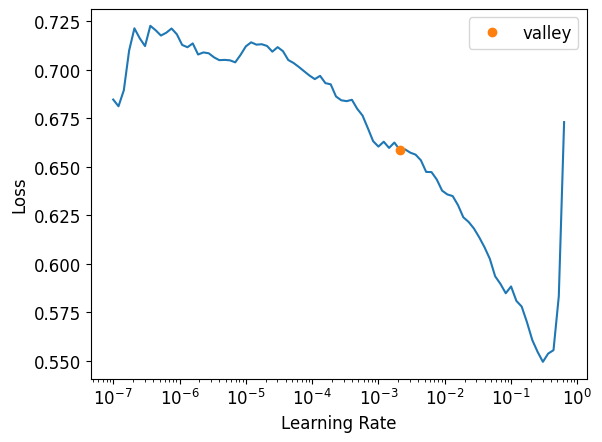

In [22]:
learn.lr_find()

In [23]:
learn.fit_one_cycle(30,1e-6)

epoch,train_loss,valid_loss,roc_auc_score,time
0,0.707676,0.723701,0.610340,00:14
1,0.686515,0.705288,0.639018,00:14
2,0.670006,0.657707,0.694617,00:14
3,0.637714,0.634810,0.765422,00:14
4,0.607791,0.661268,0.823227,00:14
5,0.587080,0.596903,0.840473,00:14
6,0.583518,0.540054,0.850629,00:14
7,0.567100,0.563613,0.857577,00:14
8,0.561031,0.582268,0.861555,00:14
9,0.559644,0.568034,0.860663,00:14


In [24]:
dl = test_dl

In [25]:
learn.save('nn_model_loan_approval_v1')

Path('models/nn_model_loan_approval_v1.pth')

In [26]:
#learn.load('nn_model_loan_approval_v1')  

In [27]:
#test_df.shape

In [28]:
nn_preds_x1 = learn.get_preds(dl=dl)[0]

In [29]:
nn_preds_x1

tensor([[0.0738, 0.9262],
        [0.6719, 0.3281],
        [0.1782, 0.8218],
        ...,
        [0.5258, 0.4742],
        [0.0169, 0.9831],
        [0.0814, 0.9186]])

In [30]:
#i select the 2nd column of the nn_preds
final_preds = nn_preds_x1[:, 1]
final_preds

tensor([0.9262, 0.3281, 0.8218,  ..., 0.4742, 0.9831, 0.9186])

In [31]:
final_preds.shape

torch.Size([39098])

In [32]:
#sub_df['loan_status'] = final_preds
#sub_df.to_csv('submission.csv', index=False)
#sub = pd.read_csv('submission.csv')
#sub

In [33]:
#dl = test_dl
#nn_preds = learn.get_preds(dl=dl)
#nn_preds_x = learn.get_preds()[0]
#a_preds, _ = learn.get_preds(dl=dl)
#nn_preds_y = a_preds.squeeze(1)
#nn_preds_proba = (a_preds[:, 1])

## XGBoost

In [34]:
xgb_params = {
    'eta': 0.044303752452182654,
    'n_estimators': 7238,
    'colsample_bytree': 0.7616580256429863,
    'subsample': 0.6586623872476727,
    'max_depth': 7,
    'min_child_weight': 17, 
    'booster': 'gbtree',
    'tree_method':'hist',
    'objective': 'binary:logistic',
    'eval_metric': 'auc',
    'device':'cuda',
}


lgbm_params = {
    'objective': 'binary',
    'boosting_type': 'gbdt',
    'num_leaves': 239,
    'learning_rate': 0.0030069363268241766,
    'n_estimators': 7689,
    'subsample_for_bin': 279725,
    'min_child_samples': 144, 
    'reg_alpha': 1.9893991901582224e-09,
    'reg_lambda': 0.18713346824755625, 
    'colsample_bytree': 0.5892053831677966,
    'subsample': 0.3744929266207266,
    'max_depth': 9
}

cat_optuna_params = {
    'loss_function': 'Logloss',
    'eval_metric': 'AUC',
    #'class_names': [0, 1],
    'learning_rate': 0.05,
    'iterations': 5000,
    'depth': 12,
    'random_strength': 0,
    'l2_leaf_reg': 0.5,
    #'max_leaves': 512,
    'fold_permutation_block': 64,
    #'task_type': 'GPU',
    #'devices': '0:1',
    'random_seed': 42,
    'verbose': False,
    'allow_writing_files': False
}

cat_params = {
    'depth': 8,
    'learning_rate': 0.19793301995319765,
    'bagging_temperature': 0.7779373495258176,
    'l2_leaf_reg': 5,
    'loss_function': 'Logloss',
    'iterations': 300,
    'grow_policy': 'Lossguide',
    'eval_metric': 'AUC',
}

#xgb params from https://www.kaggle.com/code/adyiemaz/xgb-loan-approval-prediction
xgb_params_adyiemaz = {
    'colsample_bytree': 0.5,
    'learning_rate' :0.05,
    'max_depth':5,
    'n_estimators':800,
    'reg_alpha': 1,
    'reg_lambda':0.5,
    'subsample':1,
    'eval_metric':'auc',
    'gamma':0,
    'random_state':42,
    #'early_stopping_rounds':50
}

### Optuna optimization

In [35]:
#def objective(trial):
    #params = {
        #'num_leaves': trial.suggest_int('num_leaves', 100, 500),
        #'eta': trial.suggest_float('eta', 0.001, 1.0, log=True),
        #'n_estimators': trial.suggest_int('n_estimators', 300, 10000),
        #'colsample_bytree': trial.suggest_float('colsample_bytree', 0.4, 1.0),
        #'subsample': trial.suggest_float('subsample', 0.25, 1.0),
        #'max_depth': trial.suggest_int('max_depth', 1, 15),
        #'objective': 'binary:logistic',
        #'eval_metric': 'auc',
        #'device':'cuda',

    #}
    
    #K_FOLDS = 10  # Number of folds for cross-validation
    #kfold = KFold(n_splits=K_FOLDS, shuffle=True, random_state=42)

    #xgb_fold_scores = []
    
    #for train_index, test_index in kfold.split(train_df):
    #print(f'train: {len(train_index)} samples, test: {len(test_index)} samples')

    #for train_index, val_index in kfold.split(X_train):
        #X_fold_train, X_fold_val = X_train.iloc[train_index], X_train.iloc[val_index]
        #y_fold_train, y_fold_val = y_train[train_index], y_train[val_index]
        
        # Train the model on the current fold
        
        #xgb_model_fold = xgb.XGBClassifier(**xgb_optuna_params)
        #xgb_model_fold.fit(X_fold_train, y_fold_train)
        
        # Predict probabilities on the validation set for the current fold
        #y_pred_fold = xgb_model_fold.predict_proba(X_fold_val)[:, 1]
        #y_pred_fold_tt = xgb_model_fold.predict(test_dl.xs)
        
        # Calculate and store the AUC-ROC score for the current fold
        #xgb_cv_score = roc_auc_score(y_fold_val, y_pred_fold)
        #xgb_fold_scores.append(xgb_cv_score)
        
        # Calculate the average score across all folds
        #return np.mean(xgb_fold_scores)

# Create and run the study
#study = optuna.create_study(sampler=TPESampler(n_startup_trials=30, multivariate=True, seed=0), direction="maximize")
#study.optimize(objective, n_trials=100)

#print('Best value:', study.best_value)
#print('Best trial:', study.best_trial.params)

### XGB model cross validation

In [36]:
%%time
K_FOLDS = 10  # Number of folds for cross-validation
skf = StratifiedKFold(n_splits=K_FOLDS, shuffle=True, random_state=42)
xgb_fold_scores = []

# Array to store out-of-fold predictions
#oof_predictions = np.zeros(len(X_train))

for fold, (train_index, val_index) in enumerate(skf.split(X_train, y_train), 1):
    X_fold_train, X_fold_val = X_train.iloc[train_index], X_train.iloc[val_index]
    y_fold_train, y_fold_val = y_train[train_index], y_train[val_index]
    
    # Train the model on the current fold
    xgb_model_fold = xgb.XGBClassifier(**xgb_params_adyiemaz)
    xgb_model_fold.fit(X_fold_train, y_fold_train)
    
    # Predict on the validation set for the current fold
    y_pred_fold = xgb_model_fold.predict_proba(X_fold_val)[:, 1]
    #y_pred_fold_tt = xgb_model_fold.predict(test_dl.xs)
    
    # Calculate and store the Matthews Correlation Coefficient for the current fold
    xgb_cv_score = roc_auc_score(y_fold_val, y_pred_fold)
    xgb_fold_scores.append(xgb_cv_score)
    
    print(f"Fold {fold} AUC: {xgb_cv_score}")

# Calculate and print the mean score across all folds
xgb_mean_score = np.mean(xgb_fold_scores)
print(f"Mean AUC: {xgb_mean_score}")

Fold 1 AUC: 0.960270629726922
Fold 2 AUC: 0.9589817663355351
Fold 3 AUC: 0.9630488983681572
Fold 4 AUC: 0.9589919739351558
Fold 5 AUC: 0.9584796831955922
Fold 6 AUC: 0.9594796302182667
Fold 7 AUC: 0.9574264939605848
Fold 8 AUC: 0.9544704916295825
Fold 9 AUC: 0.9547459075015893
Fold 10 AUC: 0.9577572049162958
Mean AUC: 0.9583652679787683
CPU times: user 1min 34s, sys: 587 ms, total: 1min 35s
Wall time: 48.2 s


### On full dataset

In [37]:
%%time
xgb_model = xgb.XGBClassifier(**xgb_params_adyiemaz)
xgb_model = xgb_model.fit(X_train, y_train)

#xgb_preds = tensor(xgb_model.predict(test_dl.xs))
xgb_preds_proba = tensor(xgb_model.predict_proba(test_dl.xs))[:, 1]

xgb_preds_x = tensor(xgb_model.predict(X_test))
xgb_preds_x_proba = tensor(xgb_model.predict_proba(X_test))[:, 1]

xgb_score = roc_auc_score(y_test,xgb_preds_x_proba)
xgb_score

CPU times: user 11.4 s, sys: 60.8 ms, total: 11.4 s
Wall time: 5.76 s


0.961707714913077

In [38]:
#submission
!rm submission.csv
#sub_df['loan_status'] = xgb_preds_proba
#sub_df.to_csv('submission.csv', index=False)
#sub = pd.read_csv('submission.csv')
#sub

rm: cannot remove 'submission.csv': No such file or directory


## LGBM

In [39]:
%%time
K_FOLDS = 10  # Number of folds for cross-validation
skf = StratifiedKFold(n_splits=K_FOLDS, shuffle=True, random_state=42)
lgbm_fold_scores = []

for fold, (train_index, val_index) in enumerate(skf.split(X_train, y_train), 1):
    X_fold_train, X_fold_val = X_train.iloc[train_index], X_train.iloc[val_index]
    y_fold_train, y_fold_val = y_train[train_index], y_train[val_index]
    
    # Train the model on the current fold
    lgbm_model_fold = lgb.LGBMClassifier(**lgbm_params)
    lgbm_model_fold.fit(X_fold_train, y_fold_train)
    
    # Predict on the validation set for the current fold
    y_pred_fold = lgbm_model_fold.predict_proba(X_fold_val)[:, 1]
    y_pred_fold_tt = lgbm_model_fold.predict(test_dl.xs)
    
    # Calculate and store the Root Mean Squared Error for the current fold
    lgbm_cv_score = roc_auc_score(y_fold_val, y_pred_fold)
    lgbm_fold_scores.append(lgbm_cv_score)
    
    print(f"Fold {fold} AUC: {lgbm_cv_score}")

# Calculate and print the mean score across all folds
lgbm_mean_score = np.mean(lgbm_fold_scores)
print(f"Mean RMSE: {lgbm_mean_score}")

[LightGBM] [Info] Number of positive: 11234, number of negative: 54448
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006046 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1075
[LightGBM] [Info] Number of data points in the train set: 65682, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.171036 -> initscore=-1.578301
[LightGBM] [Info] Start training from score -1.578301
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

In [40]:
print(f"Mean RMSE: {lgbm_mean_score}")

Mean RMSE: 0.9603171191940912


In [41]:
%%time
#ds subset
lgbm_model = lgb.LGBMClassifier(**lgbm_params)
lgbm_model = lgbm_model.fit(X_train, y_train)

#test set preds
#lgbm_preds = tensor(lgbm_model.predict(test_dl.xs))
lgbm_preds_proba = tensor(lgbm_model.predict_proba(test_dl.xs))[:, 1]

lgbm_preds_x_prob = tensor(lgbm_model.predict_proba(X_test))[:, 1]

lgbm_score = roc_auc_score(y_test,lgbm_preds_x_prob)
lgbm_score

[LightGBM] [Info] Number of positive: 12483, number of negative: 60498
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008095 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1086
[LightGBM] [Info] Number of data points in the train set: 72981, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.171045 -> initscore=-1.578243
[LightGBM] [Info] Start training from score -1.578243
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

0.964168078233258

In [42]:
lgbm_score

0.964168078233258

In [43]:
#submission
!rm submission.csv
#sub_df['loan_status'] = lgbm_preds_prob
#sub_df.to_csv('submission.csv', index=False)
#sub = pd.read_csv('submission.csv')
#sub

rm: cannot remove 'submission.csv': No such file or directory


In [44]:
#autogluon_lgbm_preds_proba = tensor(loaded_lgbm_model.predict_proba(test_dl.xs))[:, 1]

## Random Forests

In [45]:
%%time
rf = RandomForestClassifier(500, min_samples_leaf=3)
rf_model = rf.fit(X_train, y_train);

rf_preds = tensor(rf_model.predict(test_dl.xs))
rf_preds_proba = tensor(rf_model.predict_proba(test_dl.xs))[:, 1]

rf_preds_x = tensor(rf_model.predict(X_test))
rf_preds_proba_x = tensor(rf_model.predict_proba(X_test))[:, 1]

rf_score = roc_auc_score(y_test,rf_preds_proba_x)
rf_score

CPU times: user 1min 16s, sys: 205 ms, total: 1min 16s
Wall time: 1min 16s


0.944948539730234

In [46]:
#!rm submission.csv
#sub_df['loan_status'] = rf_preds_proba
#sub_df.to_csv('submission.csv', index=False)
#sub = pd.read_csv('submission.csv')
#sub

## CatBoost

In [47]:
%%time
#using full ds
cat_model = CatBoostClassifier(**cat_params)
cat_model = cat_model.fit(X_train, y_train, eval_set=(X_test, y_test), verbose=False)

#test set preds
cat_preds_proba = tensor(cat_model.predict_proba(test_dl.xs))[:, 1]
#cat_preds_final = cat_preds.squeeze(1)

#validation set preds

cat_preds_proba_x = tensor(cat_model.predict_proba(X_test))[:, 1]

cat_score = roc_auc_score(y_test,cat_preds_proba_x)
cat_score

CPU times: user 31.4 s, sys: 2.51 s, total: 33.9 s
Wall time: 9.14 s


0.9635346838145868

In [48]:
%%time
K_FOLDS = 10  # Number of folds for cross-validation
skf = StratifiedKFold(n_splits=K_FOLDS, shuffle=True, random_state=42)
cat_fold_scores = []

# Array to store out-of-fold predictions
#oof_predictions = np.zeros(len(X_train))

for fold, (train_index, val_index) in enumerate(skf.split(X_train, y_train), 1):
    X_fold_train, X_fold_val = X_train.iloc[train_index], X_train.iloc[val_index]
    y_fold_train, y_fold_val = y_train[train_index], y_train[val_index]
    
    # Train the model on the current fold
    cat_model_fold = CatBoostClassifier(**cat_params)
    cat_model_fold.fit(X_fold_train, y_fold_train)
    
    # Predict on the validation set for the current fold
    y_pred_fold = cat_model_fold.predict_proba(X_fold_val)[:, 1]
    #y_pred_fold_tt = xgb_model_fold.predict(test_dl.xs)
    
    # Calculate and store the Matthews Correlation Coefficient for the current fold
    cat_cv_score = roc_auc_score(y_fold_val, y_pred_fold)
    cat_fold_scores.append(cat_cv_score)
    
    print(f"Fold {fold} AUC: {cat_cv_score}")

# Calculate and print the mean score across all folds
cat_mean_score = np.mean(cat_fold_scores)
print(f"Mean AUC: {cat_mean_score}")

0:	total: 21.3ms	remaining: 6.37s
1:	total: 43.8ms	remaining: 6.53s
2:	total: 69.9ms	remaining: 6.92s
3:	total: 94.8ms	remaining: 7.01s
4:	total: 122ms	remaining: 7.19s
5:	total: 147ms	remaining: 7.21s
6:	total: 175ms	remaining: 7.3s
7:	total: 200ms	remaining: 7.29s
8:	total: 229ms	remaining: 7.39s
9:	total: 255ms	remaining: 7.4s
10:	total: 283ms	remaining: 7.44s
11:	total: 311ms	remaining: 7.46s
12:	total: 339ms	remaining: 7.47s
13:	total: 365ms	remaining: 7.46s
14:	total: 395ms	remaining: 7.5s
15:	total: 425ms	remaining: 7.54s
16:	total: 459ms	remaining: 7.64s
17:	total: 492ms	remaining: 7.71s
18:	total: 518ms	remaining: 7.67s
19:	total: 550ms	remaining: 7.7s
20:	total: 580ms	remaining: 7.71s
21:	total: 608ms	remaining: 7.68s
22:	total: 638ms	remaining: 7.69s
23:	total: 670ms	remaining: 7.7s
24:	total: 701ms	remaining: 7.71s
25:	total: 731ms	remaining: 7.71s
26:	total: 751ms	remaining: 7.6s
27:	total: 780ms	remaining: 7.58s
28:	total: 805ms	remaining: 7.53s
29:	total: 827ms	remaining

In [49]:
#submission
#!rm submission.csv
#sub_df['loan_status'] = cat_preds_proba
#sub_df.to_csv('submission.csv', index=False)
#sub = pd.read_csv('submission.csv')
#sub

## Logistic Regression

In [50]:
lr_clf = LogisticRegression(random_state=0).fit(X_train, y_train)

In [51]:
lr_clf

LogisticRegression(random_state=0)

In [52]:
lr_preds_proba = tensor(lr_clf.predict_proba(test_dl.xs))[:, 1]

lr_preds_proba_x = tensor(lr_clf.predict_proba(X_test))[:, 1]

lr_score = roc_auc_score(y_test,lr_preds_proba_x)
lr_score

0.8690883866316665

In [53]:
# Create and train the logistic regression model
lr_model = LogisticRegression(
    max_iter=10000,        # Increase max iterations to ensure convergence
    random_state=42,      # For reproducibility
    #class_weight='balanced' # To handle any class imbalance
)

In [54]:
lr_model = lr_model.fit(X_train, y_train)

In [55]:
lr_preds_proba = tensor(lr_model.predict_proba(test_dl.xs))[:, 1]

lr_preds_proba_x = tensor(lr_model.predict_proba(X_test))[:, 1]

lr_score = roc_auc_score(y_test,lr_preds_proba_x)
lr_score

0.8690883866316665

# Ensemble

## Stacking

In [56]:
stacking_estimators = [
    ('cat_boost',cat_model),
    #('rf',rf_model),
    ('lgbm',lgbm_model),
    #('xgb',xgb_model),
]
stacking_classifier_cat_lgbm= StackingClassifier(
    estimators=stacking_estimators,
    final_estimator=LogisticRegression(),
    cv=5
)
#stacking_classifier_cat_lgbm= StackingClassifier(
    #estimators=stacking_estimators,
    #final_estimator=lgb.LGBMClassifier(**lgbm_params),
    #cv=5
#)
stacking_classifier_cat_lgbm.fit(X_train, y_train)

# Predict probabilities
stacking_preds_proba_cat_lgbm = (stacking_classifier_cat_lgbm.predict_proba(test_dl.xs))[:, 1]
stacking_preds_proba_x_cat_lgbm = stacking_classifier_cat_lgbm.predict_proba(X_test)[:, 1]

stacking_score_cat_lgbm = roc_auc_score(y_test, stacking_preds_proba_x_cat_lgbm)

print(f"Final Stacking Classifier AUC-ROC on test set: {stacking_score_cat_lgbm}")

0:	total: 25.2ms	remaining: 7.53s
1:	total: 53.1ms	remaining: 7.92s
2:	total: 84.5ms	remaining: 8.37s
3:	total: 108ms	remaining: 7.96s
4:	total: 130ms	remaining: 7.68s
5:	total: 156ms	remaining: 7.67s
6:	total: 184ms	remaining: 7.7s
7:	total: 212ms	remaining: 7.72s
8:	total: 240ms	remaining: 7.76s
9:	total: 265ms	remaining: 7.67s
10:	total: 291ms	remaining: 7.64s
11:	total: 320ms	remaining: 7.68s
12:	total: 351ms	remaining: 7.74s
13:	total: 382ms	remaining: 7.81s
14:	total: 414ms	remaining: 7.87s
15:	total: 450ms	remaining: 8s
16:	total: 482ms	remaining: 8.03s
17:	total: 512ms	remaining: 8.01s
18:	total: 545ms	remaining: 8.07s
19:	total: 578ms	remaining: 8.1s
20:	total: 612ms	remaining: 8.13s
21:	total: 643ms	remaining: 8.13s
22:	total: 680ms	remaining: 8.19s
23:	total: 710ms	remaining: 8.17s
24:	total: 742ms	remaining: 8.17s
25:	total: 774ms	remaining: 8.16s
26:	total: 804ms	remaining: 8.12s
27:	total: 838ms	remaining: 8.14s
28:	total: 869ms	remaining: 8.12s
29:	total: 900ms	remaining

In [57]:
print(f"Final Stacking Classifier AUC-ROC on test set: {stacking_score_cat_lgbm}")

Final Stacking Classifier AUC-ROC on test set: 0.9652806238408919


In [58]:
#stacking_preds_proba_cat_lgbm_xgb = (stacking_preds_proba_cat_lgbm_xgb.predict_proba(test_dl.xs))[:, 1]

In [59]:
#submission
!rm submission.csv
#sub_df['loan_status'] = stacking_preds_proba_cat_lgbm
#sub_df.to_csv('submission.csv', index=False)
#sub = pd.read_csv('submission.csv')
#sub

rm: cannot remove 'submission.csv': No such file or directory


# AutoGluon

In [60]:
target = 'loan_status'
eval_metric = 'roc_auc'
train_data = train_df
Time_limit = 3600*11
#Time_limit = 900
problem_type='binary'

In [61]:
#%%time
#predictor = TabularPredictor(label=target, eval_metric=eval_metric,verbosity=1,problem_type=problem_type).fit(
    #train_data, presets='best_quality',excluded_model_types=['KNN'], time_limit=Time_limit,
    #ag_args_fit={
        #'num_gpus': 2, 
        #'stopping_metric': 'log_loss'
    #}
#)

#results = predictor.fit_summary()

Since AutoGluon has a feature that enables us to save models for use later, i built an autogluon solution using the above code and saved the models as a dataset so i can be able to call it in this notebook as using the line of code below.

If you are interested in running the autogluon solution yourself, you can just enable your gpu, uncomment the code and run it.

In [62]:
#predictor = TabularPredictor.load("/kaggle/input/s04e10-autogluon-model/AutogluonModels/ag-20241005_150901") # v1
#predictor = TabularPredictor.load("/kaggle/input/s04e10-autogluon-model/AutogluonModels/ag-20241008_103248") # v2
predictor = TabularPredictor.load("/kaggle/input/s04e10-autogluon-model/AutogluonModels/ag-20241029_155519") #v3 

In [63]:
autogluon_preds_proba = predictor.predict_proba(test_df).iloc[:, 1]

In [64]:
autogluon_preds_proba = torch.tensor(autogluon_preds_proba.values)

In [65]:
stacking_preds_proba_cat_lgbm = torch.tensor(stacking_preds_proba_cat_lgbm)

In [66]:
#stacking_preds_proba_cat_lgbm_xgb = torch.tensor(stacking_preds_proba_cat_lgbm_xgb)

# H2O

In [67]:
y = "loan_status"

In [68]:
#h2o.init()

In [69]:
#train_data = h2o.H2OFrame(train_df)

In [70]:
#test_data = h2o.H2OFrame(test_df)

In [71]:
# For binary classification, target should be a factor
#train_data[y] = train_data[y].asfactor()

#test_data[y] = test_data[y].asfactor()

In [72]:
#%%time

#aml = H2OAutoML(max_runtime_secs=3600*10,seed=42)
#you can deccrease the time limit for a faster search by commenting the code above and 
# commenting out code below and vice versa
#aml = H2OAutoML(max_runtime_secs=300,seed=42)

#aml.train(y='loan_status', training_frame=train_data)

In [73]:
# Get leaderboard with all possible columns
#lb = h2o.automl.get_leaderboard(aml, extra_columns = "ALL")
#lb

In [74]:
#leaderboard = aml.leaderboard
#print(leaderboard)
#best_model = aml.leader
#print(best_model)

In [75]:
#predictions = best_model.predict(test_data)
#predictions_df = predictions.as_data_frame()

In [76]:
#prediction_probabilities = predictions_df.iloc[:, 2]
#prediction_probabilities

In [77]:
#h2o_preds_proba = torch.tensor(prediction_probabilities.values)
#h2o_preds_proba

In [78]:
#h2o_preds_proba.shape

## Averaging

In [79]:
#lgbm_autogluon_proba = (lgbm_preds_proba + autogluon_preds_proba)/2
#lgbm_autogluon_proba.shape

In [80]:
stacking_autogluon_proba_cat_lgbm = (stacking_preds_proba_cat_lgbm + autogluon_preds_proba)/2
stacking_autogluon_proba_cat_lgbm.shape

torch.Size([39098])

In [81]:
#stacking_autogluon_proba_cat_lgbm_lgbm = (stacking_preds_proba_cat_lgbm + autogluon_preds_proba + lgbm_preds_proba )/3
#stacking_autogluon_proba_cat_lgbm_lgbm.shape

In [82]:
lgbm_xgb_proba = (lgbm_preds_proba + xgb_preds_proba)/2
lgbm_xgb_proba.shape

torch.Size([39098])

In [83]:
#stacking_autogluon_proba_cat_lgbm_h2o = (stacking_preds_proba_cat_lgbm + autogluon_preds_proba + h2o_preds_proba)/3
#stacking_autogluon_proba_cat_lgbm_h2o.shape

In [84]:
#stacking_autogluon_proba_cat_lgbm_nn = (stacking_preds_proba_cat_lgbm + autogluon_preds_proba + final_preds)/3
#stacking_autogluon_proba_cat_lgbm_nn.shape

In [85]:
#autogluon_proba_h2o = (autogluon_preds_proba + h2o_preds_proba)/2
#autogluon_proba_h2o.shape

In [86]:
#stacking_h2o = (stacking_preds_proba_cat_lgbm + h2o_preds_proba)/2
#stacking_h2o.shape

In [87]:
#lgbm_stacking_autogluon_proba = (lgbm_preds_proba + stacking_preds_proba + autogluon_preds_proba)/3
#lgbm_stacking_autogluon_proba.shape

In [88]:
#submission
!rm submission.csv
sub_df['loan_status'] = stacking_autogluon_proba_cat_lgbm
sub_df.to_csv('submission.csv', index=False)
sub = pd.read_csv('submission.csv')
sub

rm: cannot remove 'submission.csv': No such file or directory


,id,loan_status
0,58645,0.989692
1,58646,0.025409
2,58647,0.553405
3,58648,0.016643
4,58649,0.030967
...,...,...
39093,97738,0.043672
39094,97739,0.015171
39095,97740,0.016139
39096,97741,0.180985


# Ranking performance

In [89]:
AUC = pd.DataFrame({
    'algorithm': [ 'XGBoost','XGBoost CV','LGBM',
                  'LGBM CV','CatBoost','CatBoost CV',
                  'Random Forest','Stacking',
                  'Logistic Regression'
                 ],
    'AUC': [xgb_score,xgb_mean_score,lgbm_score,
            lgbm_mean_score,cat_score,cat_mean_score,
            rf_score,stacking_score_cat_lgbm,lr_score,
           ]
})

AUC_sorted = AUC.sort_values(by='AUC', ascending=False)
AUC_sorted

,algorithm,AUC
7,Stacking,0.965281
2,LGBM,0.964168
4,CatBoost,0.963535
0,XGBoost,0.961708
3,LGBM CV,0.960317
5,CatBoost CV,0.959675
1,XGBoost CV,0.958365
6,Random Forest,0.944949
8,Logistic Regression,0.869088


# Conclusions

CatBoost and LGBM seem to be the best Gradient Boosting algorithms closely followed by xgboost when properly tuned.

Stacking gets us the best combination for ensembling, this is the (CatBoost + LGBM) which outperforms any other stacking combination i have tried so far which has included adding xgboost and random forest.

I will further try to tune this by trying different meta models or adding different models to my stacking classifier.

Stacking seems to outperform voting for the initial tests which is why i choose to use a stacking classifier.

Adding the original dataset does help improve my Leaderboard and cross validation score.

Adding both AutoGluon and h2o AutoML to my stacking ensemble of CatBoost + LGBM results in the best score, improving my previous best of autogluon + stacking(CatBoost + LGBM).

